<a class="anchor" id="jump_to_top"></a>
# Data Visualization
---
Data visualization involves the creation and study of the visual representation of data. To communicate information clearly and efficiently data visualization uses statistical graphics, plots, information graphics and other tools. Effective visualization helps users analyze and reason about data and evidence. It makes complex data more accessible, understandable and usable.

**ggplot2** is the most popular package for data visualization in R. Created by Hadley Wickham, ggplot2 is an implementation of Leland Wilkinson's [Grammar of Graphics](https://www.springer.com/us/book/9780387245447)— a general scheme for data visualization which breaks up graphs into semantic components such as scales and layers. ggplot2 can serve as a replacement for the base graphics in R.

### Table of Contents
* [Overview of ggplot2](#overview_gg)
* [First graph](#first_graph)
* [The grammar of graphics](#grammar_of_graphics)
    * [Data](#Data)
    * [Themes](#Themes)
    * [Aestetics](#Aestetics)
    * [Facets layer](#Facets)
    * [Geometries layer](#Geometrics)
    * [Statistics layer](#Statistics)
        * [Position adjustments](#position)
        * [Jitter](#Jitter)
    * [Coordinates](#Coordinates)
* [Template for layered grammar of graphics](#template_for_gog)
* [More Examples](#more_examples)
    * [Bar Chart](#bar_chart)
    * [Time Series](#ts)
    * [Email Campaign Funnel](#email)
    * [ggthemes](#ggthemes)
* [Interactive plotting with Plotly](#plotly)
* [Additional Recourses](#resources)

<a class="anchor" id="overview_gg"></a>
## Overview of ggplot2

In this notebook we will focus on ggplot2 and will try to cover its main functionalities. If you have followed the **Setup** notebook you should already have ggplot2 installed since it's a part of **tidyverse** library. Before being able to use a package we need to first load it into the environment by

> `library(ggplot2)`

Alternatively one can load the entire tidyverse to include all of its core packages:

In [1]:
# loading libraries
library(tidyverse)
library(ggthemes)
library(plotly)

# modifying chart size
options(repr.plot.width=5, repr.plot.height=3)

── Attaching packages ─────────────────────────────────────── tidyverse 1.2.1 ──
✔ ggplot2 3.0.0     ✔ purrr   0.2.5
✔ tibble  1.4.2     ✔ dplyr   0.7.6
✔ tidyr   0.8.1     ✔ stringr 1.3.1
✔ readr   1.1.1     ✔ forcats 0.3.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching package: ‘plotly’

The following object is masked from ‘package:ggplot2’:

    last_plot

The following object is masked from ‘package:stats’:

    filter

The following object is masked from ‘package:graphics’:

    layout



These 8 packages are used in almost every data analysis in R. The last two lines are warning that you can ignore for now.

<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

<a class="anchor" id="first_graph"></a>
### First graph
Let's use one of the datasets that come with `ggplot2` to make a graph and answer a simple question. 

**Question**: Do cars with big engines use more fuel than cars with small engines?

**dataset**: `mpg` - contains fuel economy data from 1999 and 2008 for 38 popular models of car. 

Another way of calling a dataset that comes from a package is to first specify the package name followed by two colons, e.g.: `ggplot2::mpg`. This is usually optional, but a good practice for extra clarity if needed.

To see the content of `mpg` you can simply type
> `mpg`

in the console (or a notebook cell). To avoid getting too many rows back in the notebook I use `head()` function from base R to only load the first few rows. If you are using RStudio then by just typing `mpg` you should get the right amount of output that fits in your screen, it's because `mpg` is a `tibble`, we will learn more about `tibbles` later.

In [2]:
head(mpg)

manufacturer,model,displ,year,cyl,trans,drv,cty,hwy,fl,class
audi,a4,1.8,1999,4,auto(l5),f,18,29,p,compact
audi,a4,1.8,1999,4,manual(m5),f,21,29,p,compact
audi,a4,2.0,2008,4,manual(m6),f,20,31,p,compact
audi,a4,2.0,2008,4,auto(av),f,21,30,p,compact
audi,a4,2.8,1999,6,auto(l5),f,16,26,p,compact
audi,a4,2.8,1999,6,manual(m5),f,18,26,p,compact


Among the variables in `mpg` are
* `displ`, a car's engine size, in litres.
* `hwy`, a car's fuel efficiency on the highway, in miles per gallon (mpg). A car with a low fuel efficiency consumes more fuel than a car with a high fuel efficiency when they travel the same distance.

To access the help page and find out more about this data frame use `?mpg` command or press **F1**. A data frame is a rectangular collection of variables (in the columns) and observations (in the rows).

#### Creating a ggplot
To make a plot using `mpg` dataset run this code to put `displ` on the x-axis and `hwy` on the y-axis:

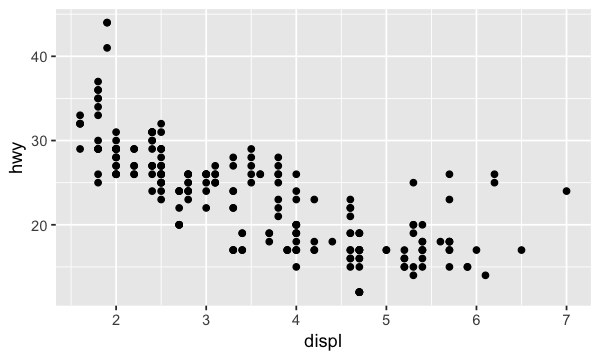

In [3]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy))

The plot shows a negative relationship between engine size (`displ`) and fuel efficiency (`hwy`). In other words, cars with big engines use more fuel.

With ggplot2, you begin a plot with the function `ggplot()`. `ggplot()` creates a coordinate system that you can add layers to. The first argument of `ggplot()` is the dataset to use in the graph. `ggplot(data = mpg)` creates an empty graph.

You complete your graph by adding one or more layers to `ggplot()`. The function `geom_point()` adds a layer of points to your plot, aka scatterplot. ggplot2 comes with many geom functions that each add a different type of layer to a plot. You'll learn a whole bunch of them throughout this notebook.

Each geom function in ggplot2 takes a `mapping` argument. This defines how variables in your dataset are mapped to visual properties. The `mapping` argument is always paired with `aes()`, and the `x` and `y` arguments of `aes()` specify which variables to map to the x and y axes. `ggplot()` looks for the mapped variable in the `data` argument, in this case, `mpg`.

<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

<a class="anchor" id="grammar_of_graphics"></a>
### The grammar of graphics
As mentioned above ggplot2 breaks up graphs into semantic components such as scales and layers. For instance the graph we just plotted consists of the following three layers
<img src="../png/3-layers-ggplot.png" width="400px" align="center">

These three layers are the minimum requirements for the data to be visualized.

<a class="anchor" id="Data"></a>
**Data -**
The source of information to be plotted. 
> `ggplot(data = mpg)`

This statement by itself would result in an empty canvas. In order to show the points we need the other two layers.

**Aestetics -**
For specifying the attributes of the plot. The aesthetics mapping describe how variables in the data are mapped to visual properties of the geometric objects. The `mapping` argument is always paired with `aes()`.
> `mapping = aes(x = displ, y = hwy)`

**Geometrics -**
Specifies the geometric object to be used for data visualization. For the example above we have used `geom_point()` to show the data points in a scatterplot.
> ```ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy))``` 

#### A graphing template
We can use the following template which represents these 3 layers. Replace the bracketed sections in the code below with a dataset, a geom function, or a collection of mappings:
> ```ggplot(data = <DATA>) + 
  <GEOM_FUNCTION>(mapping = aes(<MAPPINGS>))```

##### There are four more layers in ggplot2#####
<img src="../png/layers-of-ggplot.png" width="400px" align="center">

**Facets -**
Allow us to visualize multiple groups of the same data within one canvas. For example, in our example one could group the cars by their `drv`
* 4: Four-wheel drive
* f: Front-wheel drive
* r: Rear-wheel drive

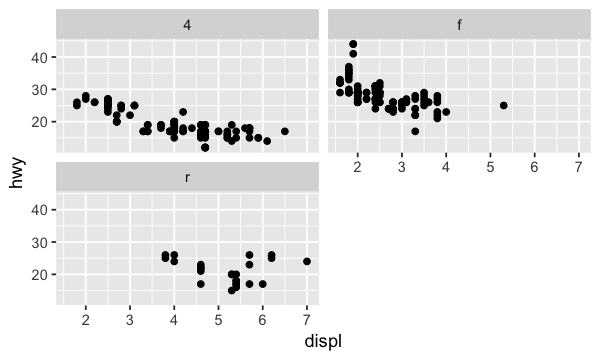

In [4]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy)) + 
  facet_wrap(~ drv, nrow = 2)

**Statistics**
This layer is to summarize or transform the data before plotting it. For instance we can fit a line to the previous plot by `geom_smooth()`

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


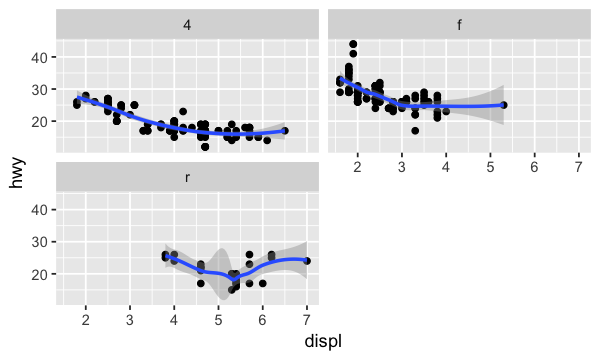

In [5]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy)) + 
  facet_wrap(~ drv, nrow = 2) +
  geom_smooth(mapping = aes(x = displ, y = hwy))

**Coordinates**


`geom_smooth()` using method = 'loess' and formula 'y ~ x'


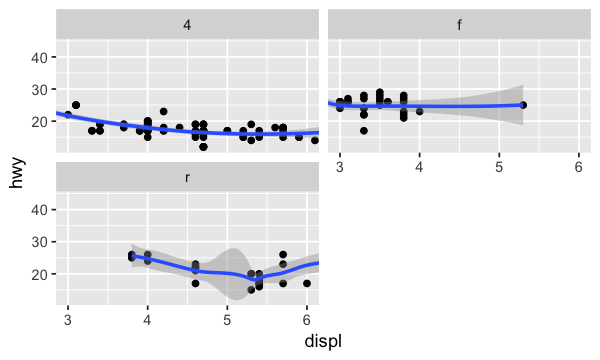

In [6]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy)) + 
  facet_wrap(~ drv, nrow = 2) +
  geom_smooth(mapping = aes(x = displ, y = hwy)) +
  coord_cartesian(xlim = c(3, 6))

<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

<a class="anchor" id="Themes"></a>
**Themes**

There are two ways to set the theme.
1) for each individual plot: add a theme layer (example below)
2) for all the plots in the script: call function `theme_set()` and set the global theme inside the function.

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


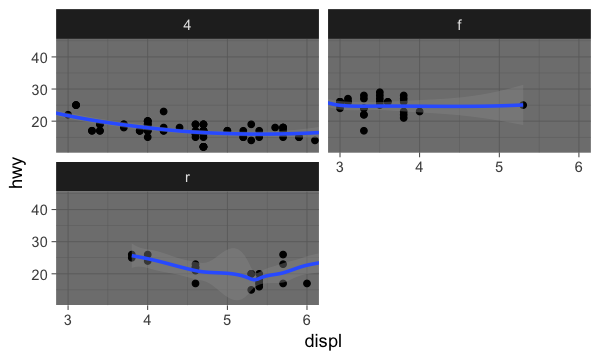

In [7]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy)) + 
  facet_wrap(~ drv, nrow = 2) +
  geom_smooth(mapping = aes(x = displ, y = hwy)) +
  coord_cartesian(xlim = c(3, 6)) +
  theme_dark()

Install **ggthemes** package for additional themes.

---
### Exercise 1
How many rows are in `mpg`? How many columns?

In [8]:
# Your answer goes here

---
### Exercise 2
What does the `drv` variable describe? Read the help for `?mpg` to find out.

In [9]:
# Your answer goes here

---
### Exercise 3
Make a scatterplot of `hwy` vs `cyl`.

In [10]:
# Your answer goes here

---
Now that we have a general idea of all the seven layers of ggplot2 let's take a deeper dive into some of them.

<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

<a class="anchor" id="Aestetics"></a>
## Aesthetics
Looking back at the first graph we made, we see that there are a few car models that despite their engine size are relatively efficient (~25 mpg) and seem to fall out of the linear trend (blue circles). How can we explain these cars? 

<img src="../png/mpg_outliers.png" width="500px" align="left">  

We might be able to explain it by their class attribute, after all not all large engine vehicles are SUV. Let's use `class` column to color the points. To do this we need to map this field to an **aesthetic**. An aesthetic is a visual property of the objects in our plot. Aesthetics include things like size, shape, or the color of our points.

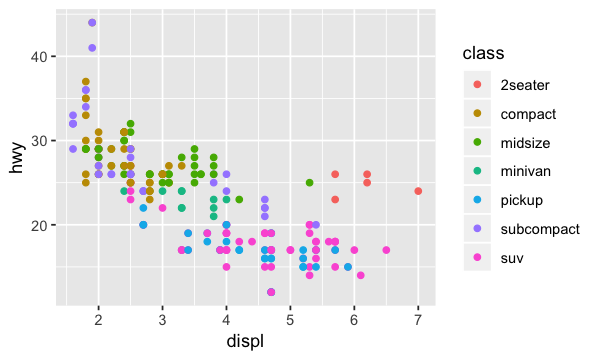

In [11]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy, color = class))

The colors reveal that many of the unusual points are two-seater cars. These sports cars have large engines like SUVs and pickup trucks, but small bodies like midsize and compact cars, which improves their gas mileage.

This is nice that ggplot will automatically pick up colors for us, we can also set the scale color:

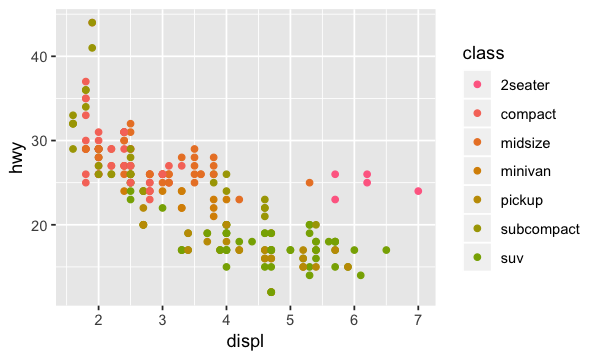

In [12]:
# Change range of hues used
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy, color = class)) +
  scale_color_hue(h = c(0, 100))

Or we could set them manually using hex color codes:

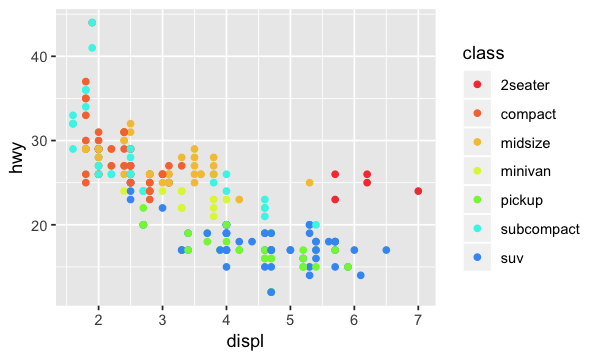

In [13]:
# Set manually 
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy, color = class)) +
  scale_color_manual(values = c("#f44242", "#f47741", "#f4c441", "#dff441", "#82f441", "#41f4e8", "#419af4"))

<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

You can also set the aesthetic properties of all points together. For example, we can make all of the points in our plot blue:

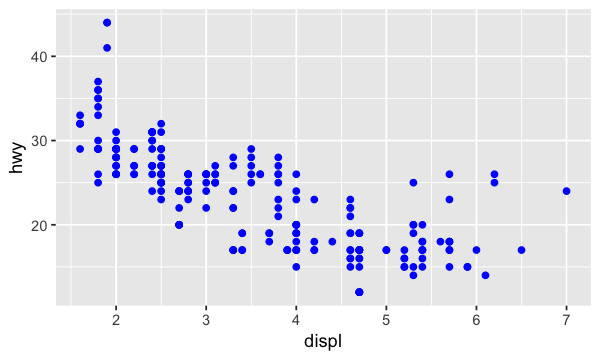

In [14]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy), color = "blue")

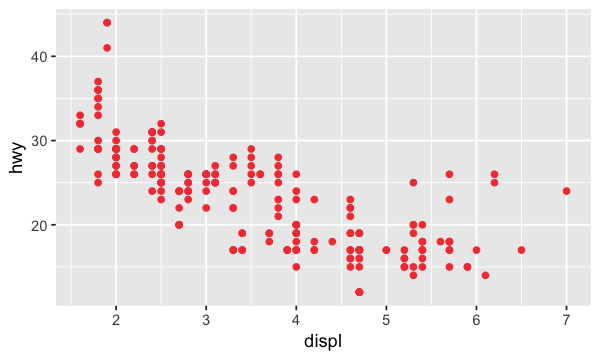

In [15]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy), color = "#f44242") # hex coloring

---
### Exercise 4
Besides `color` (aka `colour`), one could also map `class` to other aesthetics such as `shape`, `size`, and `alpha`. As a practice, using the above code try to regenerate the plot experimenting with different mappings.

In [16]:
# Your answer goes here

---
### Exercise 5
What's gone wrong with this code? Why are the points not blue?

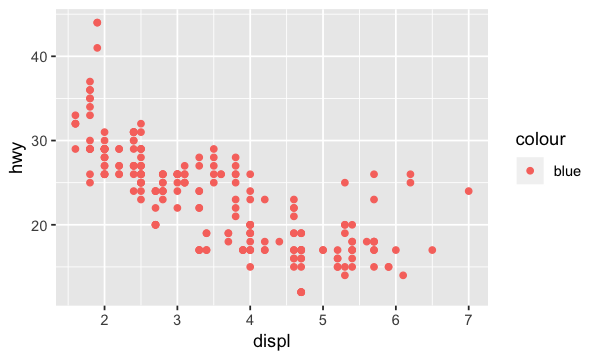

In [17]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy, color = "blue"))

In [18]:
# Your answer goes here

---
### Exercise 6
Which variables in `mpg` are categorical? Which variables are continuous? (Hint: type `?mpg` to read the documentation for the dataset). How can you see this information when you run `mpg`?

In [19]:
# Your answer goes here

---
### Exercise 7
Map a continuous variable to `color`, `size`, and `shape`. How do these aesthetics behave differently for categorical vs. continuous variables?

In [20]:
# Your answer goes here

---
### Exercise 8
What happens if you map the same variable to multiple aesthetics?

In [21]:
# Your answer goes here

---
### Exercise 9
What does the `stroke` aesthetic do? What shapes does it work with? (Hint: use `?geom_point`)

In [22]:
# Your answer goes here

---
### Exercise 10
What happens if you map an aesthetic to something other than a variable name, like `aes(color = displ < 5)`?

In [23]:
# Your answer goes here

---
<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

<a class="anchor" id="Facets"></a>
## Facets layer
One way to add additional variables is with aesthetics. Another way, particularly useful for categorical variables, is to split your plot into facets, subplots that each display one subset of the data.

To facet your plot by a single variable, use `facet_wrap()`. The first argument of `facet_wrap()` should be a formula, which you create with ~ followed by a variable name. The variable that you pass to `facet_wrap()` should be discrete.

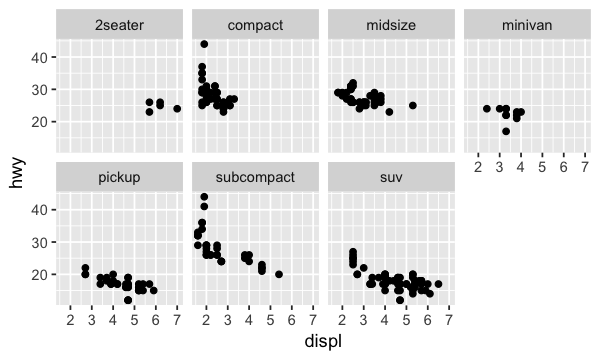

In [24]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy)) + 
  facet_wrap(~ class, nrow = 2)

To facet your plot on the combination of two variables, add `facet_grid()` to your plot call. The first argument of `facet_grid()` is also a formula. This time the formula should contain two variable names separated by a ~.

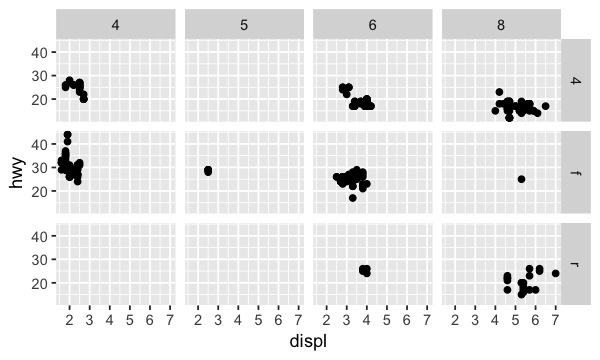

In [25]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy)) + 
  facet_grid(drv ~ cyl)

---
### Exercise 11
Read `?facet_wrap`. What does `nrow` do? What does `ncol` do? What other options control the layout of the individual panels? Why doesn't `facet_grid()` have `nrow` and `ncol` arguments?

To answer these questions try to modify the previous two plots by changing the parameters.

In [26]:
# Your answer goes here

---
<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

<a class="anchor" id="Geometrics"></a>
## Geometries layer
How are these two plots similar?

<img src="../png/two_object_plot_scatter_smooth.png" width="800px" align="center">

Both plots contain the same x variable, the same y variable, and both describe the same data. But the plots are not identical. Each plot uses a different visual object to represent the data. In ggplot2 syntax, we say that they use different **geoms**.

A **geom** is the geometrical object that a plot uses to represent data. People often describe plots by the type of geom that the plot uses. For example, bar charts use bar geoms, line charts use line geoms, boxplots use boxplot geoms, and so on. Scatterplots break the trend; they use the point geom. The plot on the left uses the point geom, and the plot on the right uses the smooth geom, a smooth line fitted to the data. To change the geom in your plot, change the geom function that you add to `ggplot()`. For instance, to make the plots above, you can use this code:

Left
> ```ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy))```
  
Right
> ```ggplot(data = mpg) + 
  geom_smooth(mapping = aes(x = displ, y = hwy))```
  
Now we can output both of these layers on top of each other:

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


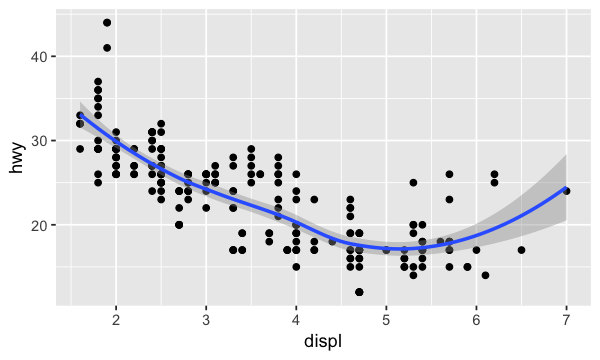

In [27]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy)) + 
  geom_smooth(mapping = aes(x = displ, y = hwy))

If you look at the help page for `geom_smooth()` you will see `method = "auto"` as a default. `method` is the smoothing method, since the default is on `"auto"` it picked `loess` (LOcal regrESSion), we can change it to linear regression, for instance, by `method = "glm"`:

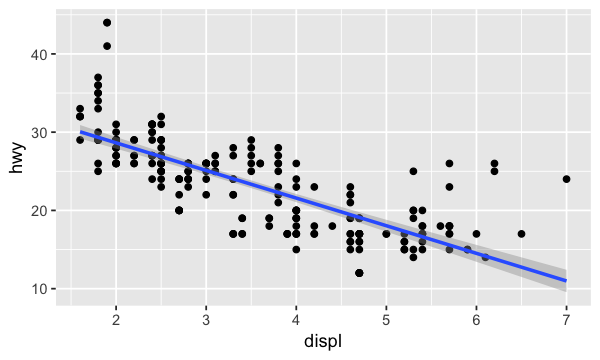

In [28]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy)) + 
  geom_smooth(mapping = aes(x = displ, y = hwy), method = "glm")

Every geom function in ggplot2 takes a `mapping` argument. However, not every aesthetic works with every geom.

A few examples:

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


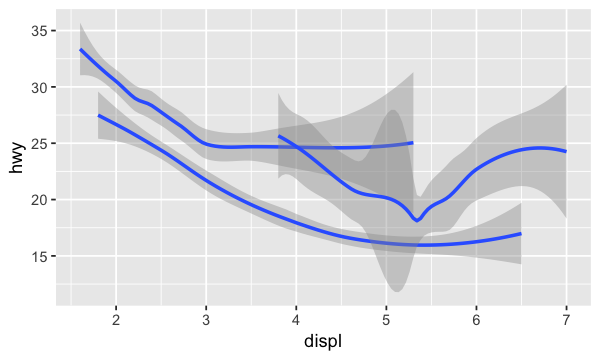

In [29]:
ggplot(data = mpg) +
  geom_smooth(mapping = aes(x = displ, y = hwy, group = drv))

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


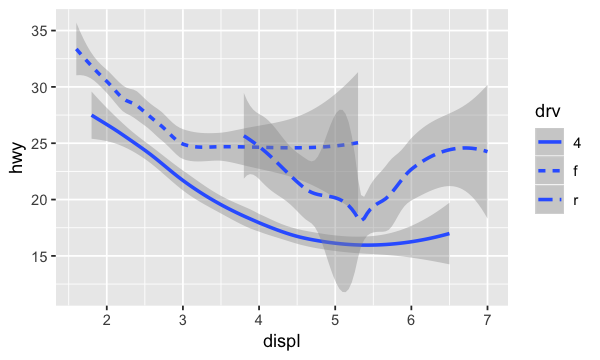

In [30]:
ggplot(data = mpg) + 
  geom_smooth(mapping = aes(x = displ, y = hwy, linetype = drv))

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


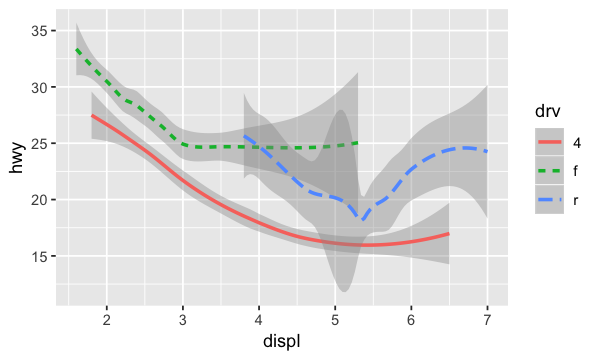

In [31]:
ggplot(data = mpg) +
  geom_smooth(
    mapping = aes(x = displ, y = hwy, color = drv, linetype = drv)
  )

---
<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

### Exercise 12
What does `na.rm = FALSE` in `geom_point()` do?

In [32]:
# Your answer goes here

---
### Exercise 13
What does `show.legend = FALSE` do? Show with an example

In [33]:
# Your answer goes here

---
### Exercise 14
Will these two graphs look different? Why/why not?
> ```ggplot(data = mpg, mapping = aes(x = displ, y = hwy)) + 
  geom_point() + 
  geom_smooth()```
  
> ```ggplot() + 
  geom_point(data = mpg, mapping = aes(x = displ, y = hwy)) + 
  geom_smooth(data = mpg, mapping = aes(x = displ, y = hwy))```

In [34]:
# Your answer goes here

---
### Exercise 15
Recreate the R code necessary to generate the following graphs:

<img src="../png/exercise15-ggplot.png" width="700px" align="center">

In [35]:
# Your answer goes here

---
<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

<a class="anchor" id="Statistics"></a>
## Statistics layer
Next, let's take a look at a bar chart. Bar charts seem simple, but they are interesting because they reveal something subtle about plots. Consider a basic bar chart, as drawn with `geom_bar()`. The following chart displays the total number of diamonds in the `diamonds` dataset, grouped by `cut`. The `diamonds` dataset comes in ggplot2 and contains information about ~54,000 diamonds, including the `price`, `carat`, `color`, `clarity`, and `cut` of each diamond. The chart shows that more diamonds are available with high quality cuts than with low quality cuts.

In [36]:
head(diamonds)

carat,cut,color,clarity,depth,table,price,x,y,z
0.23,Ideal,E,SI2,61.5,55,326,3.95,3.98,2.43
0.21,Premium,E,SI1,59.8,61,326,3.89,3.84,2.31
0.23,Good,E,VS1,56.9,65,327,4.05,4.07,2.31
0.29,Premium,I,VS2,62.4,58,334,4.20,4.23,2.63
0.31,Good,J,SI2,63.3,58,335,4.34,4.35,2.75
0.24,Very Good,J,VVS2,62.8,57,336,3.94,3.96,2.48


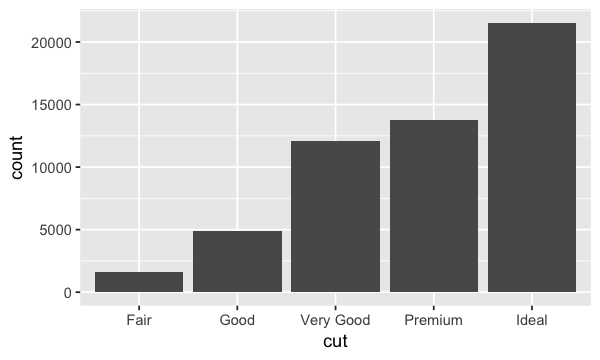

In [37]:
ggplot(data = diamonds) + 
  geom_bar(mapping = aes(x = cut))

On the x-axis, the chart displays `cut`, a variable from `diamonds`. On the y-axis, it displays count, but count is not a variable in diamonds! The algorithm used to calculate new values for a graph (count here) is called a **stat**, short for statistical transformation.

You can learn which stat a geom uses by inspecting the default value for the `stat` argument. For example, `?geom_bar` shows that the default value for `stat` is "count", which means that `geom_bar()` uses `stat_count()`.

You can generally use geoms and stats interchangeably. For example, you can recreate the previous plot using `stat_count()` instead of `geom_bar()`:

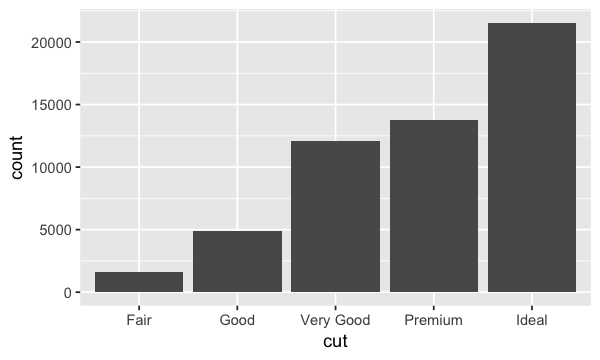

In [38]:
ggplot(data = diamonds) + 
  stat_count(mapping = aes(x = cut))

This works because every geom has a default stat; and every stat has a default geom. This means that you can typically use geoms without worrying about the underlying statistical transformation. There are three reasons you might need to use a stat explicitly:

**1)** You want to create a bar chart:

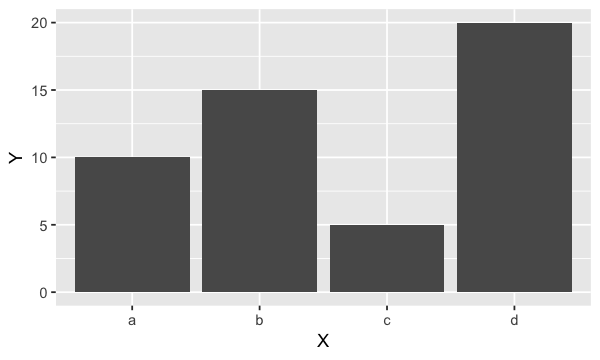

In [39]:
demo <- tribble(
  ~X,   ~Y,
  "a",  10,
  "b",  15,
  "c",   5,
  "d",  20
)

ggplot(data = demo) +
  geom_bar(mapping = aes(x = X, y = Y), stat = "identity")

Or we could use `geom_col()`; the default stat function for `geom_col()` is "identity", so no need to specify it:

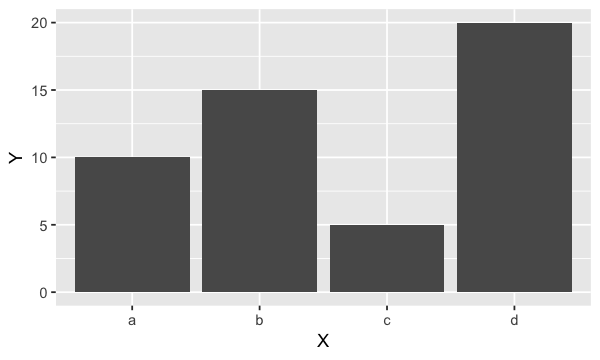

In [40]:
ggplot(data = demo) +
  geom_col(mapping = aes(x = X, y = Y))

**2)** You might want to override the default mapping from transformed variables to aesthetics. For example, you might want to display a bar chart of proportion, rather than count:

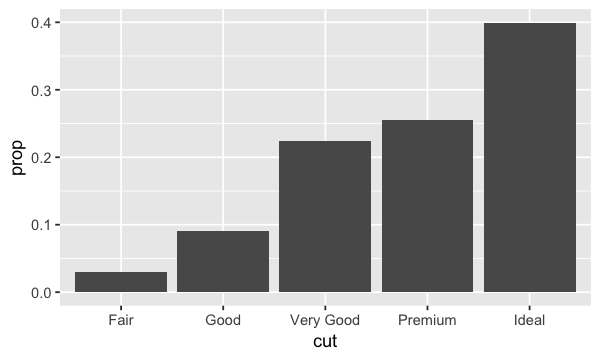

In [41]:
ggplot(data = diamonds) + 
  geom_bar(mapping = aes(x = cut, y = ..prop.., group = 1))

If `group` is not set to 1, then all the bars have `prop == 1`. The function `geom_bar()` assumes that the groups are equal to the `x` values, since the `stat` computes the counts within the group.

**3)** You might want to draw greater attention to the statistical transformation in your code. For example, you might use stat_summary(), which summarizes the y values for each unique x value, to draw attention to the summary that you're computing:

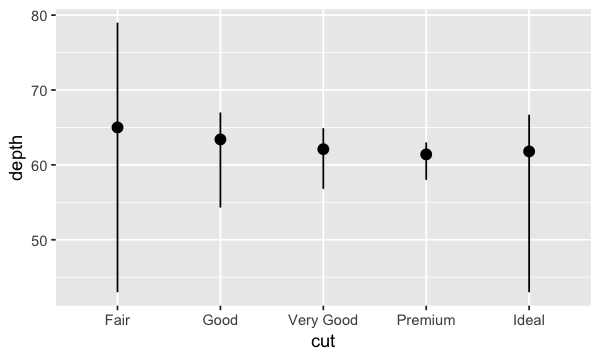

In [42]:
ggplot(data = diamonds) + 
  stat_summary(
    mapping = aes(x = cut, y = depth),
    fun.ymin = min,
    fun.ymax = max,
    fun.y = median
  )

---
### Exercise 16
What is the default geom associated with `stat_summary()`? How could you rewrite the previous plot to use that geom function instead of the stat function?

In [43]:
# Your answer goes here

---
### Exercise 17
What variables does `stat_smooth()` compute? What parameters control its behavior?

In [44]:
# Your answer goes here

---
<a class="anchor" id="position"></a>
## Position adjustments
You can color a bar chart using either the color aesthetic, or, more usefully, fill:

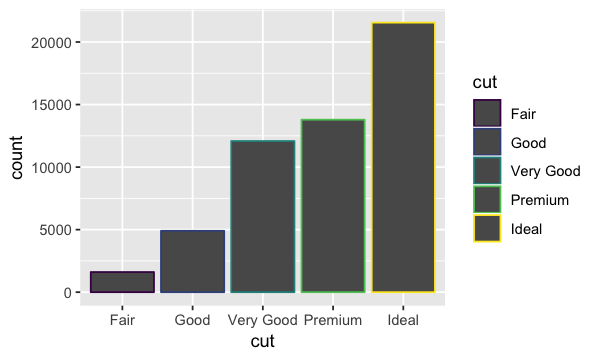

In [45]:
ggplot(data = diamonds) + 
  geom_bar(mapping = aes(x = cut, colour = cut))

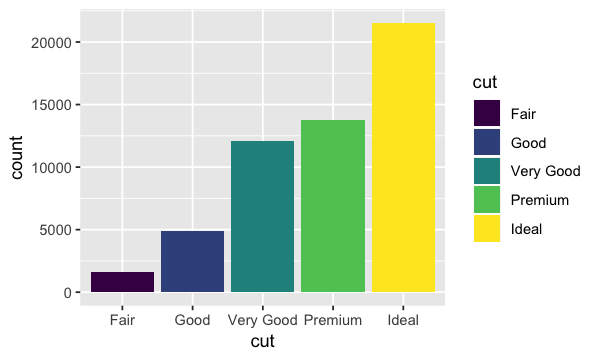

In [46]:
ggplot(data = diamonds) + 
  geom_bar(mapping = aes(x = cut, fill = cut))

Note what happens if you map the fill aesthetic to another variable, like `clarity`: the bars are automatically stacked

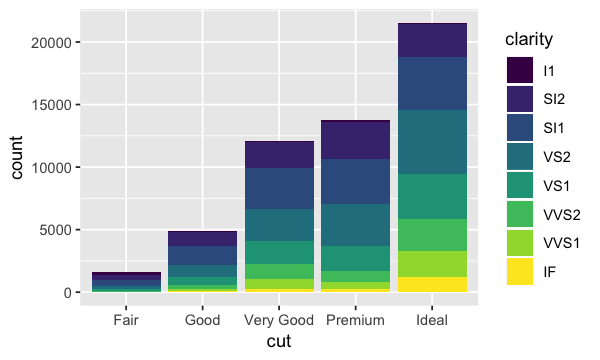

In [47]:
# Fill with clarity
ggplot(data = diamonds) + 
  geom_bar(mapping = aes(x = cut, fill = clarity))

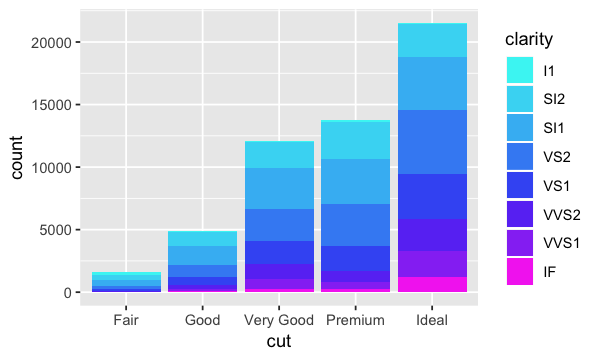

In [48]:
# Custom color
ggplot(data = diamonds) + 
  geom_bar(mapping = aes(x = cut, fill = clarity)) +
  scale_fill_manual(values = c("#41f4f4", "#41d9f4", "#41bbf4", "#418ef4", "#415ef4", "#6a41f4", "#9741f4", "#f441f1"))

The stacking is performed automatically by the position adjustment specified by the `position` argument. If you don't want a stacked bar chart, you can use one of three other options: `"identity"`, `"dodge"` or `"fill"`.

* `position = "identity"` will place each object exactly where it falls in the context of the graph. This is not very useful for bars, because it overlaps them. To see that overlapping we can make the bars slightly transparent by setting alpha to a small value:

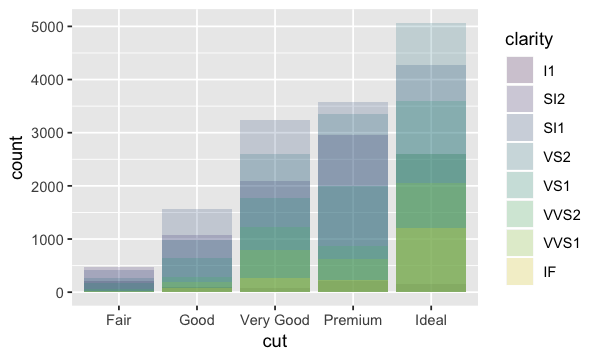

In [49]:
# position = "identity"
ggplot(data = diamonds, mapping = aes(x = cut, fill = clarity)) + 
  geom_bar(alpha = 1/5, position = "identity")

* `position = "fill"` works like stacking, but makes each set of stacked bars the same height. This makes it easier to compare proportions across groups:

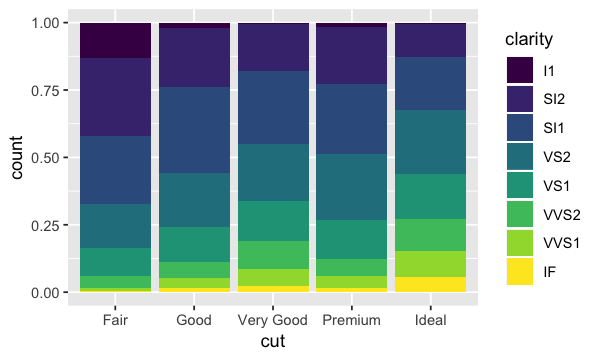

In [50]:
# position = "fill"
ggplot(data = diamonds) + 
  geom_bar(mapping = aes(x = cut, fill = clarity), position = "fill")

* `position = "dodge"` places overlapping objects directly beside one another:

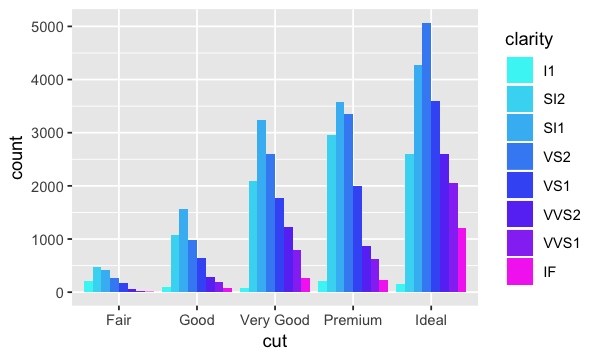

In [51]:
# position = "dodge"
ggplot(data = diamonds) + 
  geom_bar(mapping = aes(x = cut, fill = clarity), position = "dodge") +
  scale_fill_manual(values = c("#41f4f4", "#41d9f4", "#41bbf4", "#418ef4", "#415ef4", "#6a41f4", "#9741f4", "#f441f1"))

### Histogram
A histogram is an accurate representation of the distribution of numerical data.

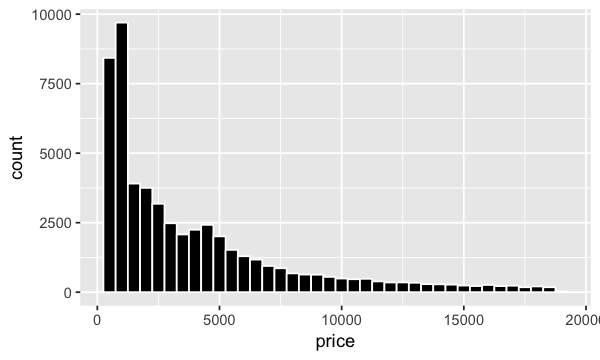

In [52]:
ggplot(diamonds, aes(price)) +
  geom_histogram(binwidth = 500, fill = "black", color = "white")

<a class="anchor" id="Jitter"></a>
### Jitter
There's one other type of adjustment that's not useful for bar charts, but it can be very useful for scatterplots. If you recall our very first plot we were looking at a dataset with 234 observations, but in fact the chart shows only 126 points

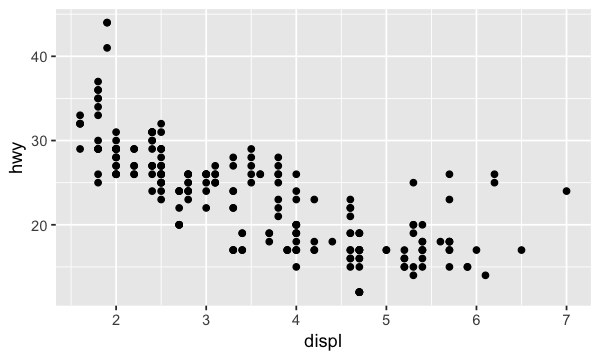

In [53]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy))

The values of `hwy` and `displ` are rounded so the points appear on a grid and many points overlap each other. This problem is known as overplotting. To show all the points we can add `position = "jitter"` to the function and `ggplot()` will automatically shift the point just enough that they are visible.

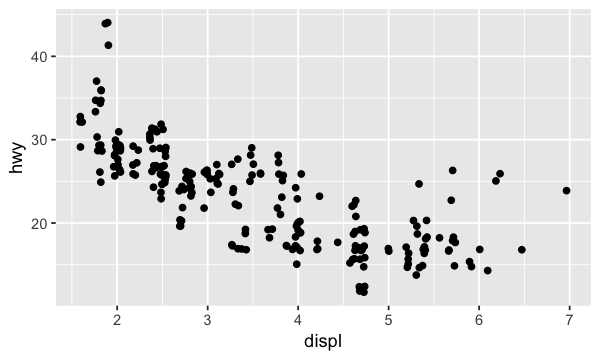

In [54]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy), position = "jitter")

We can also add some transparency to make the points more visible, using `alpha`

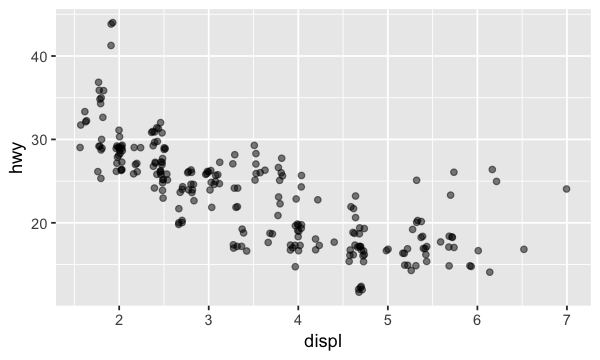

In [55]:
ggplot(data = mpg) + 
  geom_point(mapping = aes(x = displ, y = hwy), position = "jitter", alpha = 1/2)

To learn more about a position adjustment, look up the help page associated with each adjustment: `?position_dodge`, `?position_fill`, `?position_identity`, `?position_jitter`, and `?position_stack`.

---
### Exercise 18
What is the problem with this plot? How could you improve it?

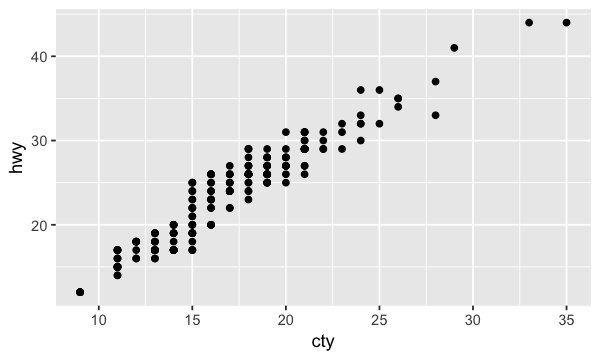

In [56]:
ggplot(data = mpg, mapping = aes(x = cty, y = hwy)) + 
  geom_point()

---
### Exercise 19
Use `position_jitter()` to modify the amount of jittering. What parameters to `geom_jitter()` control the amount of jittering?

---
### Exercise 20
Compare and contrast `geom_jitter()` with `geom_count()`.

---
### Exercise 21
We haven't plotted a boxplot yet, check out the documentation for `geom_boxplot()` and look at some the examples. What's the default position adjustment for `geom_boxplot()`? Create a visualization of the mpg dataset that demonstrates it.

---
<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

## Coordinates
The default coordinate system is the Cartesian coordinate system where the x and y positions act independently to determine the location of each point. There are a number of other coordinate systems that are occasionally helpful.

* `coord_flip()`

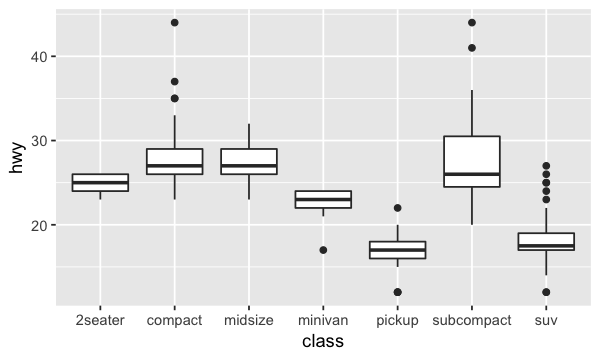

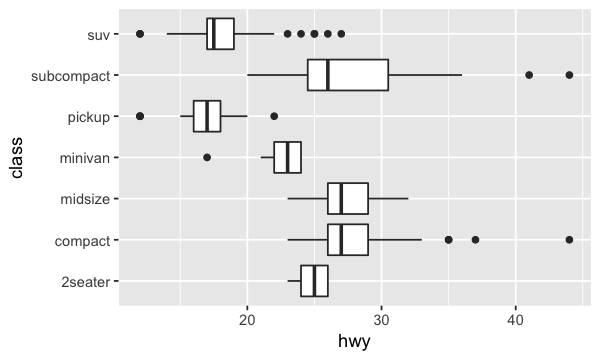

In [57]:
ggplot(data = mpg, mapping = aes(x = class, y = hwy)) + 
  geom_boxplot()

ggplot(data = mpg, mapping = aes(x = class, y = hwy)) + 
  geom_boxplot() +
  coord_flip()

* `coord_polar()`

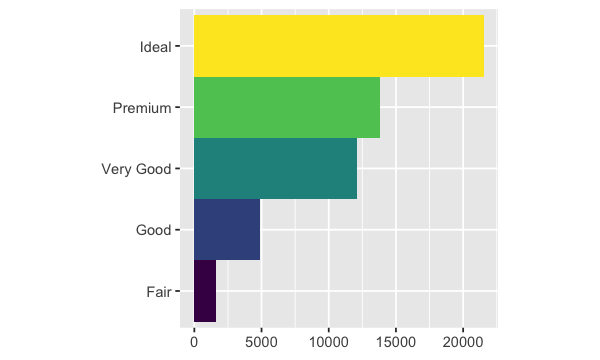

In [58]:
bar <- ggplot(data = diamonds) + 
  geom_bar(
    mapping = aes(x = cut, fill = cut), 
    show.legend = FALSE,
    width = 1
  ) + 
  theme(aspect.ratio = 1) +
  labs(x = NULL, y = NULL)

bar + coord_flip()

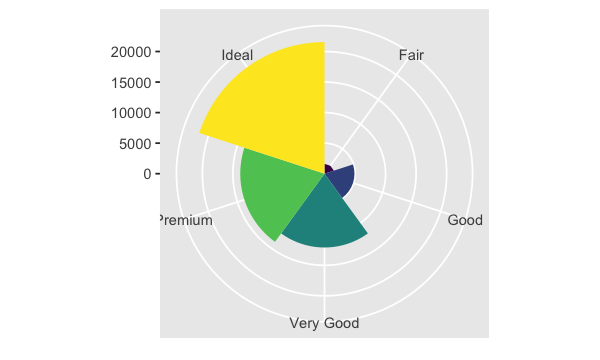

In [59]:
bar + coord_polar()

---
### Exercise 22
What does `labs()` do? Read the documentation.

---
### Exercise 23
What does the plot below tell you about the relationship between city and highway mpg? Why is `coord_fixed()` important? What does `geom_abline()` do?

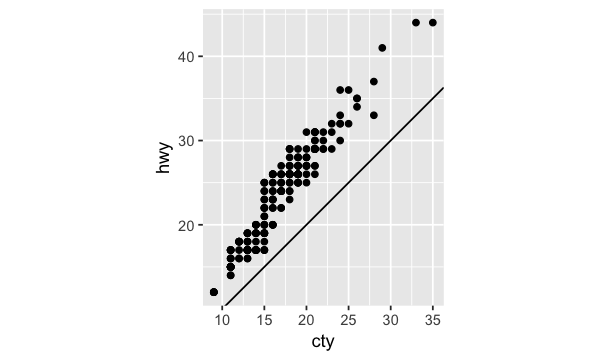

In [60]:
ggplot(data = mpg, mapping = aes(x = cty, y = hwy)) +
  geom_point() + 
  geom_abline() +
  coord_fixed()

---
<a class="anchor" id="template_for_gog"></a>
<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>
## Template for layered grammar of graphics


> ```ggplot(data = <DATA>) + 
  <GEOM_FUNCTION>(
     mapping = aes(<MAPPINGS>),
     stat = <STAT>, 
     position = <POSITION>
  ) +
  <COORDINATE_FUNCTION> +
  <FACET_FUNCTION>
```

In practice, you rarely need to supply all seven parameters to make a graph because ggplot2 will provide useful defaults for everything except the data, the mappings, and the geom function.

---
<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>
<a class="anchor" id="more_examples"></a>
## More Examples
<a class="anchor" id="bar_chart"></a>
**Bar Chart** from [Top 50 ggplot2 Visualizations](http://r-statistics.co/Top50-Ggplot2-Visualizations-MasterList-R-Code.html).

We saw how to create a bar chart with `geom_bar()`. By default `geom_bar()` will use `stat = "count"`, so we don't need to provide a `y`, it's being calculated as the count of points in each bin. In order to create a bar chart with a given `y` value we need to set `stat=identity` and provide both `x` and `y` inside `aes()` `x` is either character or factor and `y` is numeric.

In [61]:
# create a frequency table
freqtable <- table(mpg$manufacturer)
df <- as.data.frame.table(freqtable)
head(df)

Var1,Freq
audi,18
chevrolet,19
dodge,37
ford,25
honda,9
hyundai,14


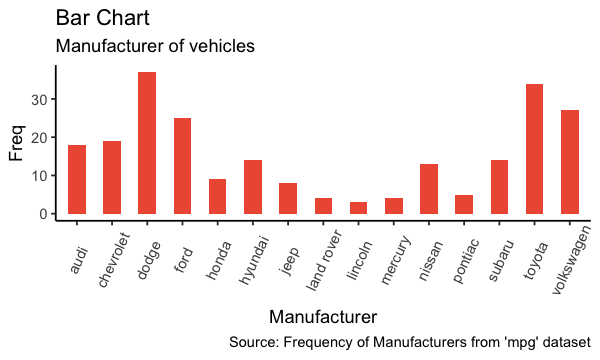

In [62]:
#theme_set(theme_classic())

# Plot
ggplot(df, aes(Var1, Freq)) + 
  geom_bar(stat="identity", width = 0.5, fill="tomato2") + 
  labs(title="Bar Chart", 
       subtitle="Manufacturer of vehicles", 
       caption="Source: Frequency of Manufacturers from 'mpg' dataset") +
  xlab("Manufacturer") +
  theme_classic() +
  theme(axis.text.x = element_text(angle=65, vjust=0.6))  # to give x labels an angle for readability 

<a class="anchor" id="ts"></a>
#### Time Series
Using `geom_line()`, a time series (or line chart) can be drawn. Data: `economics` from ggplot2.

In [63]:
head(economics)

date,pce,pop,psavert,uempmed,unemploy
1967-07-01,507.4,198712,12.5,4.5,2944
1967-08-01,510.5,198911,12.5,4.7,2945
1967-09-01,516.3,199113,11.7,4.6,2958
1967-10-01,512.9,199311,12.5,4.9,3143
1967-11-01,518.1,199498,12.5,4.7,3066
1967-12-01,525.8,199657,12.1,4.8,3018


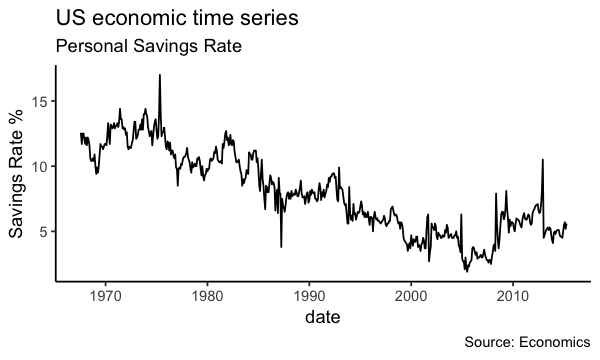

In [64]:
# Allow Default X Axis Labels
ggplot(economics, aes(x=date)) + 
  geom_line(aes(y=psavert)) + 
  labs(title="US economic time series", 
       subtitle = "Personal Savings Rate",
       caption="Source: Economics", 
       y="Savings Rate %") +
  theme_classic()

<a class="anchor" id="email"></a>
**Email Campaign Funnel** from [Top 50 ggplot2 Visualizations](http://r-statistics.co/Top50-Ggplot2-Visualizations-MasterList-R-Code.html):

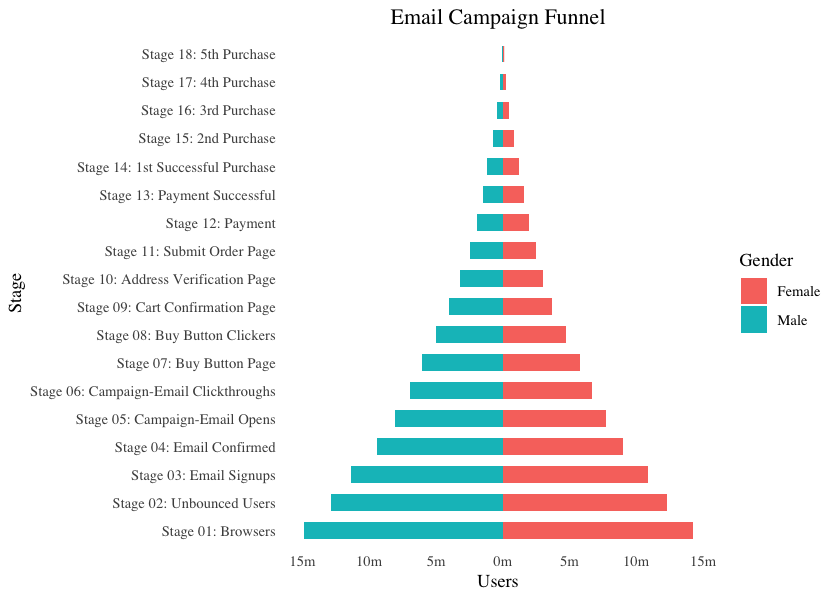

In [65]:
options(scipen = 999)  # turns off scientific notations like 1e+40
options(repr.plot.width=7, repr.plot.height=5)  # Modifying the chart size

# Read data
options(readr.num_columns = 0)  # turns off messages printed by read_csv
email_campaign_funnel <- read_csv("https://raw.githubusercontent.com/selva86/datasets/master/email_campaign_funnel.csv")

# X Axis Breaks and Labels 
brks <- seq(-15000000, 15000000, 5000000)
lbls = paste0(as.character(c(seq(15, 0, -5), seq(5, 15, 5))), "m")

# Plot
ggplot(email_campaign_funnel, aes(x = Stage, y = Users, fill = Gender)) +   # Fill column
                              geom_bar(stat = "identity", width = .6) +   # draw the bars
                              scale_y_continuous(breaks = brks,   # Breaks
                                                 labels = lbls) + # Labels
                              coord_flip() +  # Flip axes
                              labs(title = "Email Campaign Funnel") +
                              theme_tufte() +  # Tufte theme from ggfortify
                              theme(plot.title = element_text(hjust = .5), 
                                    axis.ticks = element_blank())  # Centre plot title

<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

<a class="anchor" id="ggthemes"></a>
### ggthemes
First let's look at a simple scatterplot made by `geom_point()` and with no themes:

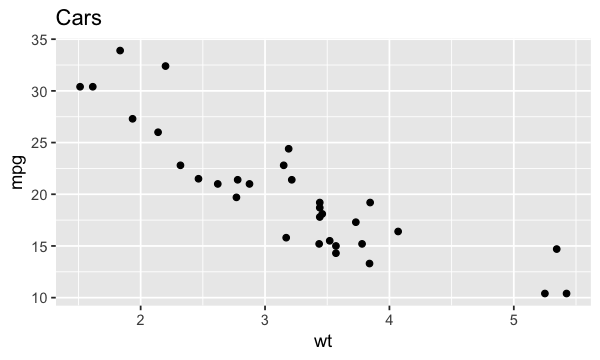

In [66]:
options(repr.plot.width=5, repr.plot.height=3)  # Modifying the chart size, back to the regular size

p <- ggplot(mtcars, aes(x = wt, y = mpg)) +
  geom_point() +
  ggtitle("Cars")
p

p2 <- ggplot(mtcars, aes(x = wt, y = mpg, colour = factor(gear))) +
  geom_point() +
  ggtitle("Cars")

<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

#### Tufte theme and geoms
Minimal theme and geoms based on plots in The Visual Display of Quantitative Information.

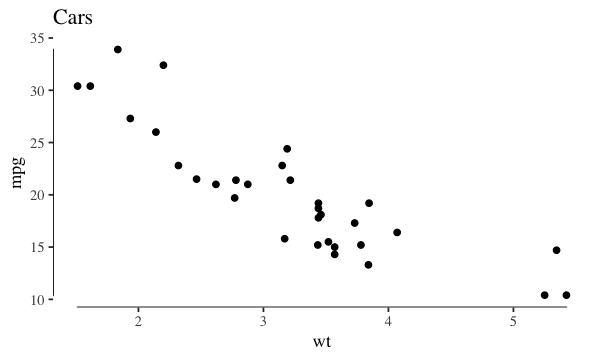

In [67]:
p + geom_rangeframe() +
  theme_tufte()

#### Economist theme
A theme that approximates the style of plots in The Economist magazine.

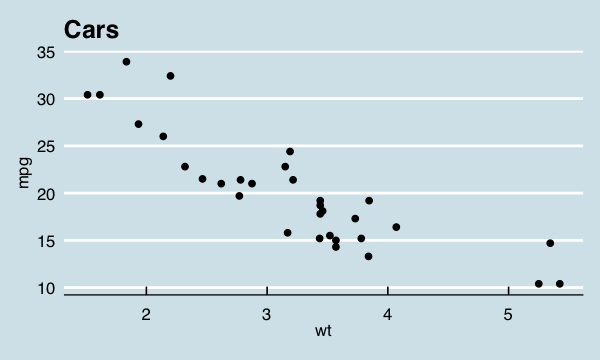

In [68]:
p + theme_economist() + scale_colour_economist() 

#### Excel 2003 theme
For that classic ugly look and feel

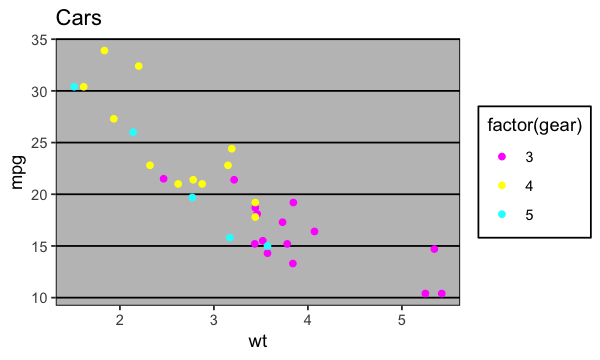

In [69]:
p2 + theme_excel() + scale_colour_excel()

#### Wall Street Journal
Theme and some color palettes based on plots in the The Wall Street Journal.

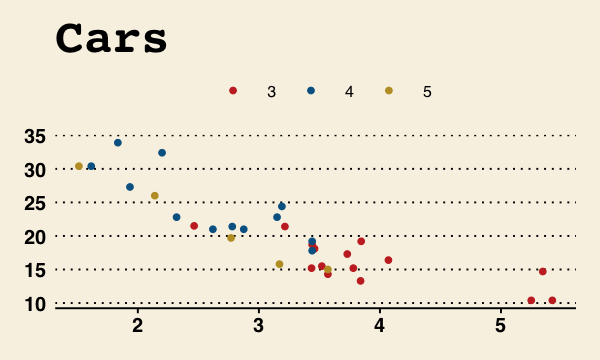

In [70]:
p2 + theme_wsj() + scale_colour_wsj("colors6", "")

<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>

<a class="anchor" id="plotly"></a>
# Interactive plotting with Plotly
We can use package **plotly** on top of a ggplot plot to create interactive charts. Plotly is a powerful tool for creating interactive dashboards and plots and there are different ways to use it. Here we will only show how to make ggplots into a plotly by using `ggplotly()` function. For more information about other ways to leverage this package go to [ploy.ly](https://plot.ly/).

## Scatterplot
Let's use the most recent plot we created with WSJ theme as an example:

In [71]:
ggplotly(p2 + theme_wsj() + scale_colour_wsj("colors6", ""))

Warning message:
“plotly.js does not (yet) support horizontal legend items 
You can track progress here: 
https://github.com/plotly/plotly.js/issues/53 
”

HTML widgets cannot be represented in plain text (need html)

## Time Series

In [72]:
ts_plot <- ggplot(economics, aes(x=date)) + 
geom_line(aes(y=psavert)) + 
  labs(title="US economic time series", 
       subtitle = "Personal Savings Rate",
       caption="Source: Economics", 
       y="Savings Rate %") +
  theme_classic()

ggplotly(ts_plot)

HTML widgets cannot be represented in plain text (need html)

## Bar chart

In [73]:
bar_plot <- ggplot(data = diamonds) + 
  geom_bar(mapping = aes(x = cut, fill = clarity), position = "dodge") +
  scale_fill_manual(values = c("#41f4f4", "#41d9f4", "#41bbf4", "#418ef4", "#415ef4", "#6a41f4", "#9741f4", "#f441f1"))

ggplotly(bar_plot)

HTML widgets cannot be represented in plain text (need html)

<a class="anchor" id="resources"></a>
# Additional Recourses
* Examples of elaborate charts: [Top 50 ggplot2 Visualizations](http://r-statistics.co/Top50-Ggplot2-Visualizations-MasterList-R-Code.html)
* To go beyond ggplot2 functionalities check out these extensions: [ggplot2 extensions](http://www.ggplot2-exts.org/gallery/)
* *ggplot2-cheatsheet.pdf* in the cheatsheets directory
* Hex color
    * Simply google "hex color picker" and use Google's tool
    * There are many other online sources, a highly customizable tool can be found in [Mozilla](https://developer.mozilla.org/en-US/docs/Web/CSS/CSS_Colors/Color_picker_tool)
* Themes
    * [ggthemes](https://github.com/jrnold/ggthemes) - Examples [here](https://mran.microsoft.com/snapshot/2016-12-03/web/packages/ggthemes/vignettes/ggthemes.html)
    * [ggtech](https://github.com/ricardo-bion/ggtech)
    
<div style="text-align: right"> [[Jump to top]](#jump_to_top) </div>